<a href="https://colab.research.google.com/github/ceciliabelem/AluraStore/blob/main/alurastorebr.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Requisitos:
Analisar os dados das lojas:

* Você deve avaliar informações como faturamento, categorias mais vendidas, avaliações dos clientes, produtos mais vendidos e frete médio.

* Criar gráficos para visualização:

  * Decida quais tipos de gráficos usar para apresentar os resultados de maneira clara e visual.

  * Mínimo de 3 gráficos diferentes, que podem incluir gráficos de barras, pizza, dispersão, entre outros.

* Apresentar uma recomendação:

* Após as análises, escreva um texto explicando qual loja o Senhor João deve vender e por quê, com base nos dados apresentados.

* Criar um readme.md

Bom projeto!

In [30]:
!pip install folium==0.14.0

### Importação dos dados



In [31]:
import pandas as pd
import matplotlib.pyplot as plt

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_1.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_4.csv"

loja = pd.read_csv(url)
loja2 = pd.read_csv(url2)
loja3 = pd.read_csv(url3)
loja4 = pd.read_csv(url4)

loja.head()

,Produto,Categoria do Produto,Preço,Frete,Data da Compra,Vendedor,Local da compra,Avaliação da compra,Tipo de pagamento,Quantidade de parcelas,lat,lon
0,Assistente virtual,eletronicos,219.08,9.249790,16/01/2021,Pedro Gomes,SP,4,cartao_credito,8,-22.19,-48.79
1,Mesa de jantar,moveis,256.35,11.234305,18/05/2022,Beatriz Moraes,RJ,1,cartao_credito,4,-22.25,-42.66
2,Jogo de tabuleiro,brinquedos,279.51,21.262681,15/03/2021,João Souza,DF,1,cartao_credito,1,-15.83,-47.86
3,Micro-ondas,eletrodomesticos,1009.99,54.667344,03/05/2022,João Souza,RS,4,boleto,1,-30.17,-53.50
4,Cadeira de escritório,moveis,446.99,26.964689,07/11/2020,Larissa Alves,MG,5,boleto,1,-18.10,-44.38


In [32]:
loja2.head()

,Produto,Categoria do Produto,Preço,Frete,Data da Compra,Vendedor,Local da compra,Avaliação da compra,Tipo de pagamento,Quantidade de parcelas,lat,lon
0,Cadeira de escritório,moveis,378.20,20.421138,04/08/2021,Thiago Silva,MG,1,boleto,1,-18.10,-44.38
1,Pandeiro,instrumentos musicais,102.37,3.035334,26/11/2020,Bianca Santos,RJ,3,cartao_credito,4,-22.25,-42.66
2,Cama king,moveis,591.13,31.759020,22/10/2021,Thiago Silva,SC,5,cartao_credito,10,-27.45,-50.95
3,Cama king,moveis,1208.24,61.919584,04/05/2022,Larissa Alves,RS,5,cartao_credito,10,-30.17,-53.50
4,Cadeira de escritório,moveis,530.41,25.827176,26/02/2022,Lucas Oliveira,SP,4,cartao_credito,3,-22.19,-48.79


In [33]:
loja3.head()

,Produto,Categoria do Produto,Preço,Frete,Data da Compra,Vendedor,Local da compra,Avaliação da compra,Tipo de pagamento,Quantidade de parcelas,lat,lon
0,Secadora de roupas,eletrodomesticos,1713.50,88.823159,17/12/2021,Camila Ribeiro,CE,4,cartao_credito,4,-5.20,-39.53
1,Cômoda,moveis,386.81,18.180908,10/02/2021,Larissa Alves,RS,3,cartao_credito,1,-30.17,-53.50
2,Violão,instrumentos musicais,404.62,23.197592,22/01/2023,Lucas Oliveira,SP,5,cartao_credito,3,-22.19,-48.79
3,Bola de vôlei,esporte e lazer,78.40,4.463341,22/03/2022,Pedro Gomes,BA,4,cartao_credito,6,-13.29,-41.71
4,Guarda roupas,moveis,694.76,34.578319,12/01/2022,Bianca Santos,SP,1,cartao_credito,1,-22.19,-48.79


In [34]:
loja4.head()

,Produto,Categoria do Produto,Preço,Frete,Data da Compra,Vendedor,Local da compra,Avaliação da compra,Tipo de pagamento,Quantidade de parcelas,lat,lon
0,Lava louças,eletrodomesticos,1446.46,74.604083,11/11/2022,Rafael Costa,SP,4,cartao_credito,3,-22.19,-48.79
1,Cama box,moveis,631.70,33.919251,03/01/2020,Thiago Silva,GO,5,cartao_credito,2,-15.98,-49.86
2,Bola de basquete,esporte e lazer,31.54,0.000000,25/12/2022,Larissa Alves,MG,5,boleto,1,-18.10,-44.38
3,Modelagem preditiva,livros,76.93,1.680730,23/11/2021,Lucas Oliveira,MG,3,boleto,1,-18.10,-44.38
4,Fone de ouvido,eletronicos,185.14,7.442587,25/04/2022,Bianca Santos,SP,4,cartao_credito,7,-22.19,-48.79


#1. Análise do faturamento


In [35]:
# Calcular o faturamento total para cada loja
faturamento_loja1 = loja['Preço'].sum()
faturamento_loja2 = loja2['Preço'].sum()
faturamento_loja3 = loja3['Preço'].sum()
faturamento_loja4 = loja4['Preço'].sum()

In [36]:
#Exibir o faturamento de cada loja formatado como dinheiro
print(f"Faturamento da Loja 1: {faturamento_loja1}")
print(f"Faturamento da Loja 2: {faturamento_loja2}")
print(f"Faturamento da Loja 3: {faturamento_loja3}")
print(f"Faturamento da Loja 4: {faturamento_loja4}")

Faturamento da Loja 1: 1534509.12
Faturamento da Loja 2: 1488459.06
Faturamento da Loja 3: 1464025.03
Faturamento da Loja 4: 1384497.58


# 2. Vendas por Categoria


In [37]:
vendas_categoria_loja1 = loja['Categoria do Produto'].value_counts()
vendas_categoria_loja2 = loja2['Categoria do Produto'].value_counts()
vendas_categoria_loja3 = loja3['Categoria do Produto'].value_counts()
vendas_categoria_loja4 = loja4['Categoria do Produto'].value_counts()

In [38]:
print("Vendas por Categoria - Loja 1: ")
print(vendas_categoria_loja1)
print("\nVendas por Categoria - Loja 2: ")
print(vendas_categoria_loja2)
print("\nVendas por Categoria - Loja 3: ")
print(vendas_categoria_loja3)
print("\nVendas por Categoria - Loja 4: ")
print(vendas_categoria_loja4)

Vendas por Categoria - Loja 1: 
Categoria do Produto
moveis                   465
eletronicos              448
brinquedos               324
eletrodomesticos         312
esporte e lazer          284
instrumentos musicais    182
livros                   173
utilidades domesticas    171
Name: count, dtype: int64

Vendas por Categoria - Loja 2: 
Categoria do Produto
moveis                   442
eletronicos              422
brinquedos               313
eletrodomesticos         305
esporte e lazer          275
instrumentos musicais    224
livros                   197
utilidades domesticas    181
Name: count, dtype: int64

Vendas por Categoria - Loja 3: 
Categoria do Produto
moveis                   499
eletronicos              451
brinquedos               315
eletrodomesticos         278
esporte e lazer          277
livros                   185
instrumentos musicais    177
utilidades domesticas    177
Name: count, dtype: int64

Vendas por Categoria - Loja 4: 
Categoria do Produto
moveis     

# 3. Média de Avaliação das Lojas

In [39]:
media_avaliacao_loja1 = loja['Avaliação da compra'].mean()
media_avaliacao_loja2 = loja2['Avaliação da compra'].mean()
media_avaliacao_loja3 = loja3['Avaliação da compra'].mean()
media_avaliacao_loja4 = loja4['Avaliação da compra'].mean()

In [40]:
print(f"Média de Avaliação da Loja 1: {media_avaliacao_loja1: .2f}")
print(f"Média de Avaliação da Loja 2: {media_avaliacao_loja2: .2f}")
print(f"Média de Avaliação da Loja 3: {media_avaliacao_loja3: .2f}")
print(f"Média de Avaliação da Loja 4: {media_avaliacao_loja4: .2f}")

Média de Avaliação da Loja 1:  3.98
Média de Avaliação da Loja 2:  4.04
Média de Avaliação da Loja 3:  4.05
Média de Avaliação da Loja 4:  4.00


# 4. Produtos Mais e Menos Vendidos

In [41]:
# Calcular a contagem de vendas para cada produto em cada loja
vendas_produto_loja1 = loja['Produto'].value_counts()
vendas_produto_loja2 = loja2['Produto'].value_counts()
vendas_produto_loja3 = loja3['Produto'].value_counts()
vendas_produto_loja4 = loja4['Produto'].value_counts()

# Encontrar o produto mais vendido e menos vendido para cada loja
produto_mais_vendido_loja1 = vendas_produto_loja1.index[0]
quantidade_mais_vendido_loja1 = vendas_produto_loja1.iloc[0]

produto_menos_vendido_loja1 = vendas_produto_loja1.index[-1]
quantidade_menos_vendido_loja1 = vendas_produto_loja1.iloc[-1]

produto_mais_vendido_loja2 = vendas_produto_loja2.index[0]
quantidade_mais_vendido_loja2 = vendas_produto_loja2.iloc[0]

produto_menos_vendido_loja2 = vendas_produto_loja2.index[-1]
quantidade_menos_vendido_loja2 = vendas_produto_loja2.iloc[-1]

produto_mais_vendido_loja3 = vendas_produto_loja3.index[0]
quantidade_mais_vendido_loja3 = vendas_produto_loja3.iloc[0]

produto_menos_vendido_loja3 = vendas_produto_loja3.index[-1]
quantidade_menos_vendido_loja3 = vendas_produto_loja3.iloc[-1]

produto_mais_vendido_loja4 = vendas_produto_loja4.index[0]
quantidade_mais_vendido_loja4 = vendas_produto_loja4.iloc[0]

produto_menos_vendido_loja4 = vendas_produto_loja4.index[-1]
quantidade_menos_vendido_loja4 = vendas_produto_loja4.iloc[-1]


In [42]:
# Exibir os resltados
print("Produtos Mais e Menos Vendidos - Loja 1:")
print(f"Mais Vendido: {produto_mais_vendido_loja1}({quantidade_mais_vendido_loja1} vendas)")
print(f"Menos Vendido: {produto_menos_vendido_loja1}({quantidade_menos_vendido_loja1} vendas)")

print("Produtos Mais e Menos Vendidos - Loja 2:")
print(f"Mais Vendido: {produto_mais_vendido_loja2}({quantidade_mais_vendido_loja2} vendas)")
print(f"Menos Vendido: {produto_menos_vendido_loja2}({quantidade_menos_vendido_loja2} vendas)")

print("Produtos Mais e Menos Vendidos - Loja 3:")
print(f"Mais Vendido: {produto_mais_vendido_loja3}({quantidade_mais_vendido_loja3} vendas)")
print(f"Menos Vendido: {produto_menos_vendido_loja3}({quantidade_menos_vendido_loja3} vendas)")

print("Produtos Mais e Menos Vendidos - Loja 4:")
print(f"Mais Vendido: {produto_mais_vendido_loja4}({quantidade_mais_vendido_loja4} vendas)")
print(f"Menos Vendido: {produto_menos_vendido_loja4}({quantidade_menos_vendido_loja4} vendas)")

Produtos Mais e Menos Vendidos - Loja 1:
Mais Vendido: Micro-ondas(60 vendas)
Menos Vendido: Celular ABXY(33 vendas)
Produtos Mais e Menos Vendidos - Loja 2:
Mais Vendido: Iniciando em programação(65 vendas)
Menos Vendido: Jogo de tabuleiro(32 vendas)
Produtos Mais e Menos Vendidos - Loja 3:
Mais Vendido: Kit banquetas(57 vendas)
Menos Vendido: Blocos de montar(35 vendas)
Produtos Mais e Menos Vendidos - Loja 4:
Mais Vendido: Cama box(62 vendas)
Menos Vendido: Guitarra(33 vendas)


# 5. Frete Médio por Loja


In [43]:
frete_medio_loja1 = loja['Frete'].mean()
frete_medio_loja2 = loja2['Frete'].mean()
frete_medio_loja3 = loja3['Frete'].mean()
frete_medio_loja4 = loja4['Frete'].mean()

In [44]:
# Exibir o frete médio de cada loja

print(f'Frete médio da Loja 1: {frete_medio_loja1: .2f}')
print(f'Frete médio da Loja 2: {frete_medio_loja2: .2f}')
print(f'Frete médio da Loja 3: {frete_medio_loja3: .2f}')
print(f'Frete médio da Loja 4: {frete_medio_loja4: .2f}')

Frete médio da Loja 1:  34.69
Frete médio da Loja 2:  33.62
Frete médio da Loja 3:  33.07
Frete médio da Loja 4:  31.28


# Raio X - Lojas
## Análise do faturamento

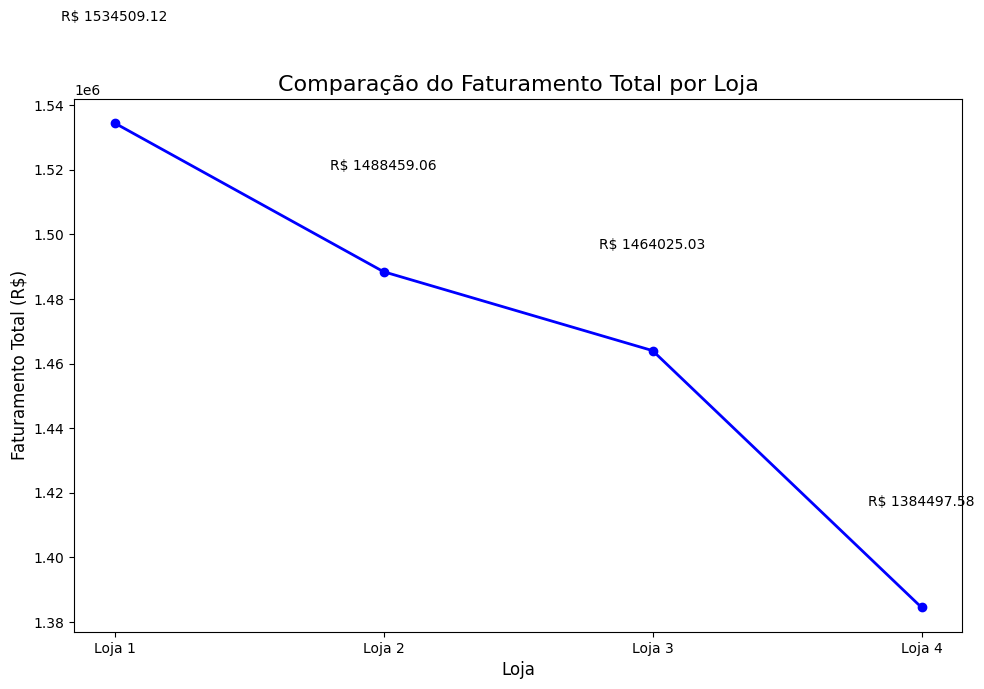

In [45]:
# Criar listas com os nomes das lojas e os valores de faturamento
lojas = ['Loja 1', 'Loja 2', 'Loja 3', 'Loja 4']
faturamentos = [faturamento_loja1, faturamento_loja2, faturamento_loja3, faturamento_loja4]

# Criar o gráfico de linha para comparar o faturamento
plt.figure(figsize=(10, 7)) # Define o tamanho da figura
plt.plot(lojas, faturamentos, marker='o', linestyle='-', color='blue', linewidth=2) # Cria o gráfico de linha

# Adicionar título e rótulos aos eixos
plt.title('Comparação do Faturamento Total por Loja', fontsize=16)
plt.xlabel('Loja', fontsize=12)
plt.ylabel('Faturamento Total (R$)', fontsize=12)

# Adicionar os valores exatos acima dos pontos (opcional)
for i, fat in enumerate(faturamentos):
    plt.text(i, fat + (max(faturamentos)*0.02), f'R$ {fat:.2f}', ha='center', va='bottom', fontsize=10) # Posiciona o texto um pouco acima do ponto

# Melhorar o layout
plt.tight_layout()

# Exibir o gráfico
plt.show()

## Análise das Avaliações

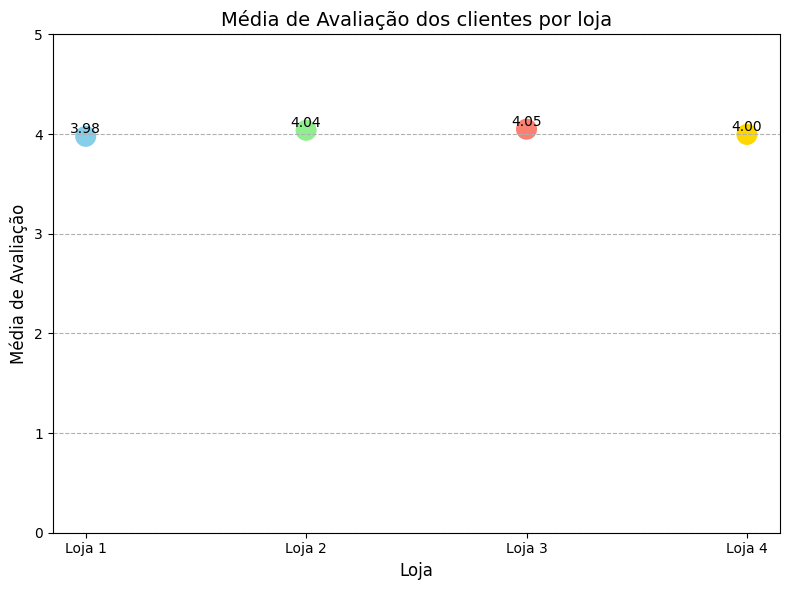

In [46]:
medias_avaliacao = [media_avaliacao_loja1, media_avaliacao_loja2, media_avaliacao_loja3, media_avaliacao_loja4]

# Criar gráfico de dispersão
plt.figure(figsize = (8, 6))
plt.scatter(lojas, medias_avaliacao, color = ['skyblue', 'lightgreen', 'salmon', 'gold'], s = 200) #s = tmanho dos pontos

# Adicionar títullos e rótulos aos eixos
plt.title('Média de Avaliação dos clientes por loja', fontsize = 14)
plt.xlabel('Loja', fontsize = 12)
plt.ylabel('Média de Avaliação', fontsize = 12)
plt.ylim(0,5) # define o limite do eixo y para a escala de avaliação (0 a 5)
plt.grid(axis = 'y', linestyle = '--')

# Adiciona os valores exatos ao lado dos pontos
for i, media in enumerate(medias_avaliacao):
  plt.text(i, media, f'{media:.2f}', ha = 'center', va = 'bottom', fontsize = 10)

plt.tight_layout()
plt.show()

## Produtos Mais e Menos Vendidos - Loja 1

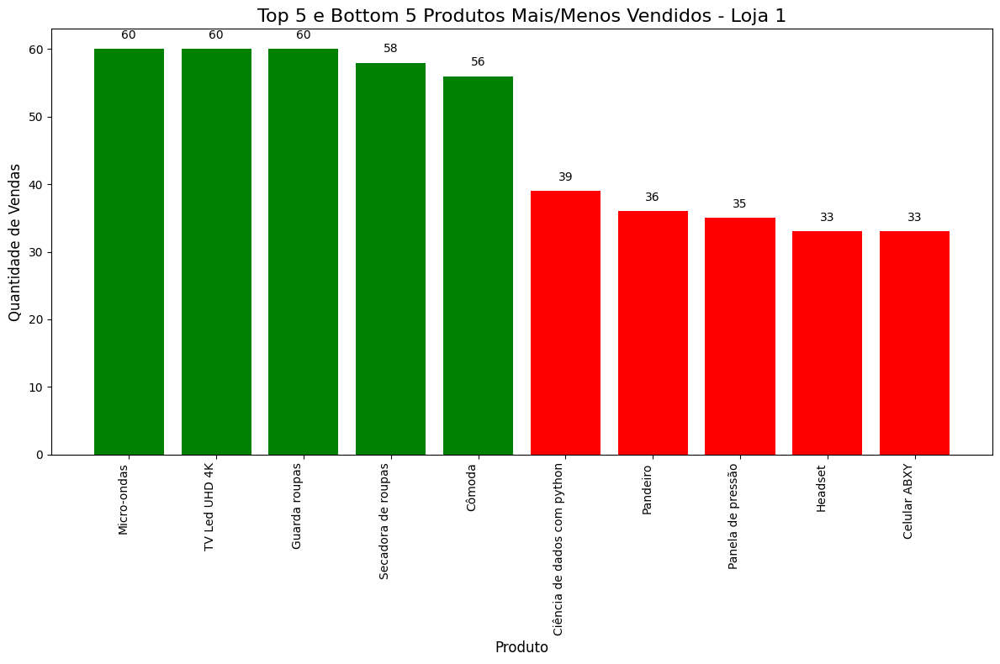

In [47]:
# Pegar os Top 5 e Bottom 5 produtos
top_5_produtos = vendas_produto_loja1.head(5)
bottom_5_produtos = vendas_produto_loja1.tail(5)

# Combinar os dados para o gráfico
produtos_nomes = top_5_produtos.index.tolist() + bottom_5_produtos.index.tolist()
produtos_quantidades = top_5_produtos.values.tolist() + bottom_5_produtos.values.tolist()

# Criar o gráfico de barras
plt.figure(figsize=(12, 8))
plt.bar(produtos_nomes, produtos_quantidades, color=['green']*5 + ['red']*5) # Cores diferentes para mais e menos vendidos

# Adicionar título e rótulos
plt.title('Top 5 e Bottom 5 Produtos Mais/Menos Vendidos - Loja 1', fontsize=16)
plt.xlabel('Produto', fontsize=12)
plt.ylabel('Quantidade de Vendas', fontsize=12)
plt.xticks(rotation=90, ha='right') # Rotaciona os rótulos do eixo X para melhor leitura

# Adicionar os valores exatos acima das barras (opcional)
for i, quantidade in enumerate(produtos_quantidades):
    plt.text(i, quantidade + (max(produtos_quantidades)*0.02), str(quantidade), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

## Produtos Mais e Menos Vendidos - Loja 2

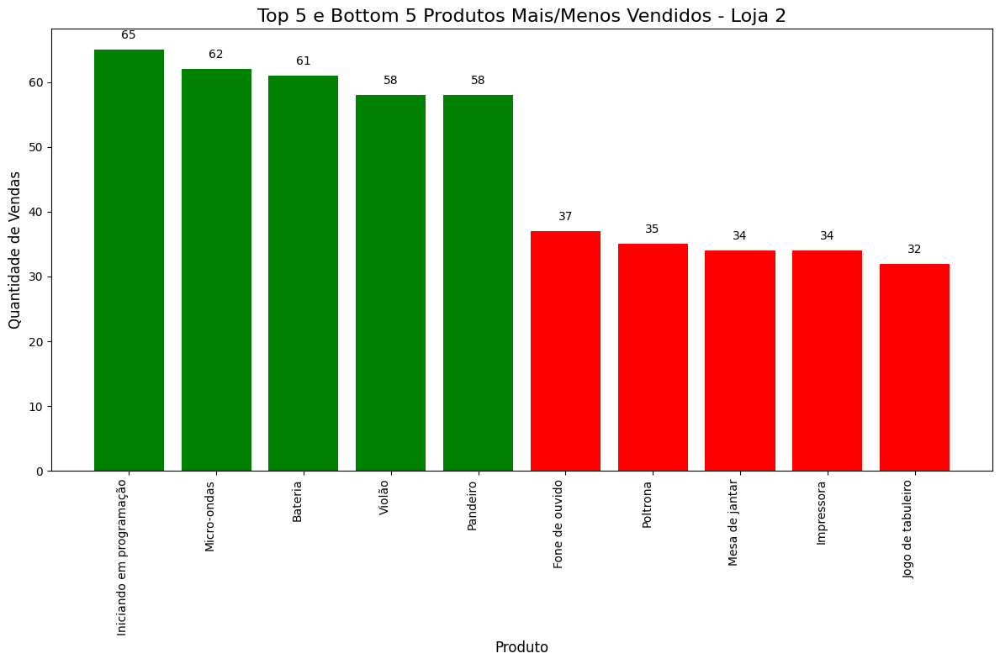

In [48]:
# Pegar os Top 5 e Bottom 5 produtos
top_5_produtos = vendas_produto_loja2.head(5)
bottom_5_produtos = vendas_produto_loja2.tail(5)

# Combinar os dados para o gráfico
produtos_nomes = top_5_produtos.index.tolist() + bottom_5_produtos.index.tolist()
produtos_quantidades = top_5_produtos.values.tolist() + bottom_5_produtos.values.tolist()

# Criar o gráfico de barras
plt.figure(figsize=(12, 8))
plt.bar(produtos_nomes, produtos_quantidades, color=['green']*5 + ['red']*5) # Cores diferentes para mais e menos vendidos

# Adicionar título e rótulos
plt.title('Top 5 e Bottom 5 Produtos Mais/Menos Vendidos - Loja 2', fontsize=16)
plt.xlabel('Produto', fontsize=12)
plt.ylabel('Quantidade de Vendas', fontsize=12)
plt.xticks(rotation=90, ha='right') # Rotaciona os rótulos do eixo X para melhor leitura

# Adicionar os valores exatos acima das barras (opcional)
for i, quantidade in enumerate(produtos_quantidades):
    plt.text(i, quantidade + (max(produtos_quantidades)*0.02), str(quantidade), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

## Produtos Mais e Menos Vendidos - Loja 3

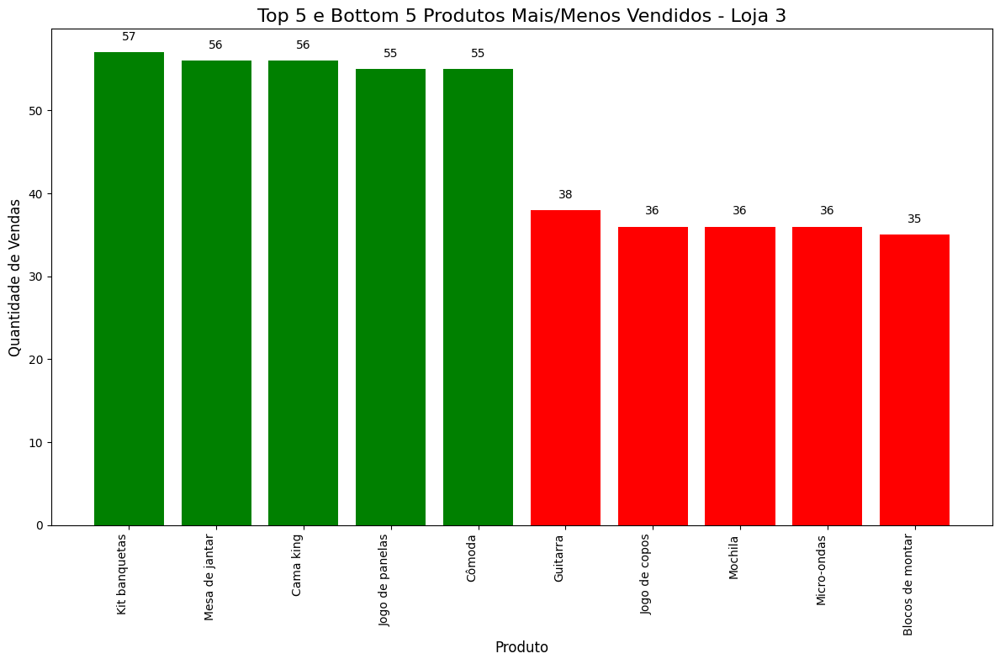

In [49]:
# Pegar os Top 5 e Bottom 5 produtos
top_5_produtos = vendas_produto_loja3.head(5)
bottom_5_produtos = vendas_produto_loja3.tail(5)

# Combinar os dados para o gráfico
produtos_nomes = top_5_produtos.index.tolist() + bottom_5_produtos.index.tolist()
produtos_quantidades = top_5_produtos.values.tolist() + bottom_5_produtos.values.tolist()

# Criar o gráfico de barras
plt.figure(figsize=(12, 8))
plt.bar(produtos_nomes, produtos_quantidades, color=['green']*5 + ['red']*5) # Cores diferentes para mais e menos vendidos

# Adicionar título e rótulos
plt.title('Top 5 e Bottom 5 Produtos Mais/Menos Vendidos - Loja 3', fontsize=16)
plt.xlabel('Produto', fontsize=12)
plt.ylabel('Quantidade de Vendas', fontsize=12)
plt.xticks(rotation=90, ha='right') # Rotaciona os rótulos do eixo X para melhor leitura

# Adicionar os valores exatos acima das barras (opcional)
for i, quantidade in enumerate(produtos_quantidades):
    plt.text(i, quantidade + (max(produtos_quantidades)*0.02), str(quantidade), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

## Produtos Mais e Menos Vendidos - Loja 4

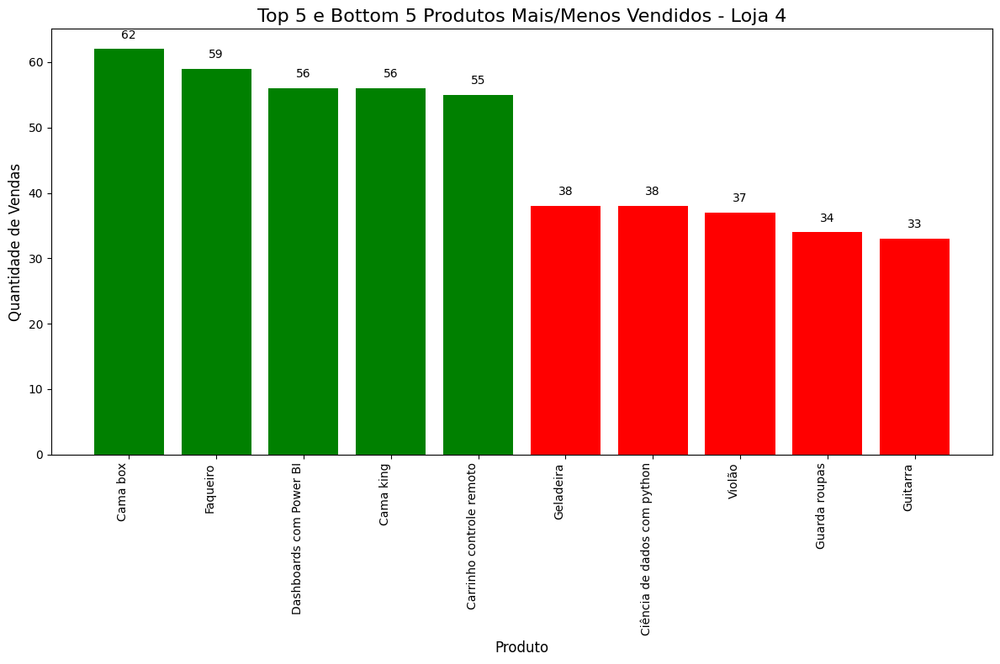

In [50]:
# Pegar os Top 5 e Bottom 5 produtos
top_5_produtos = vendas_produto_loja4.head(5)
bottom_5_produtos = vendas_produto_loja4.tail(5)

# Combinar os dados para o gráfico
produtos_nomes = top_5_produtos.index.tolist() + bottom_5_produtos.index.tolist()
produtos_quantidades = top_5_produtos.values.tolist() + bottom_5_produtos.values.tolist()

# Criar o gráfico de barras
plt.figure(figsize=(12, 8))
plt.bar(produtos_nomes, produtos_quantidades, color=['green']*5 + ['red']*5) # Cores diferentes para mais e menos vendidos

# Adicionar título e rótulos
plt.title('Top 5 e Bottom 5 Produtos Mais/Menos Vendidos - Loja 4', fontsize=16)
plt.xlabel('Produto', fontsize=12)
plt.ylabel('Quantidade de Vendas', fontsize=12)
plt.xticks(rotation=90, ha='right') # Rotaciona os rótulos do eixo X para melhor leitura

# Adicionar os valores exatos acima das barras (opcional)
for i, quantidade in enumerate(produtos_quantidades):
    plt.text(i, quantidade + (max(produtos_quantidades)*0.02), str(quantidade), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

## Análise de Desempenho Geográfico


In [52]:
import folium

# Criar um mapa base (você pode ajustar as coordenadas iniciais e o zoom)
# As coordenadas abaixo são um ponto médio aproximado das suas vendas no Brasil, ajuste se necessário
mapa_vendas = folium.Map(location=[-14.235004, -51.92528], zoom_start=4)

# Adicionar os pontos de venda de cada loja ao mapa
# Loja 1 (azul)
for index, row in loja.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=2, # Tamanho do círculo
        color='blue', # Cor para Loja 1
        fill=True,
        fill_color='blue',
        fill_opacity=0.6,
        tooltip=f"Loja 1 - Venda em {row['Local da compra']}" # Informação ao passar o mouse
    ).add_to(mapa_vendas)

# Loja 2 (verde)
for index, row in loja2.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=2,
        color='green', # Cor para Loja 2
        fill=True,
        fill_color='green',
        fill_opacity=0.6,
        tooltip=f"Loja 2 - Venda em {row['Local da compra']}"
    ).add_to(mapa_vendas)

# Loja 3 (vermelho)
for index, row in loja3.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=2,
        color='red', # Cor para Loja 3
        fill=True,
        fill_color='red',
        fill_opacity=0.6,
        tooltip=f"Loja 3 - Venda em {row['Local da compra']}"
    ).add_to(mapa_vendas)

# Loja 4 (laranja)
for index, row in loja4.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=2,
        color='orange', # Cor para Loja 4
        fill=True,
        fill_color='orange',
        fill_opacity=0.6,
        tooltip=f"Loja 4 - Venda em {row['Local da compra']}"
    ).add_to(mapa_vendas)

# Para exibir o mapa no Colab:
mapa_vendas

# Analise de Desempenho entre Lojas
Para Sr. João

## Introdução

Este relatório apresenta a análise dos dados de vendas de quatro lojas com o objetivo de recomendar ao Senhor João qual delas ele deve considerar para venda. A análise considerou métricas financeiras, de produtos e de satisfação do cliente para fornecer uma base de decisão sólida.

## Análise das Lojas

Nesta seção, apresentaremos os principais resultados das análises realizadas para cada loja, destacando os pontos relevantes para a comparação.

### 1. Faturamento Total

O faturamento total é um indicador crucial do desempenho financeiro de cada loja. Analisamos a receita gerada por cada uma:


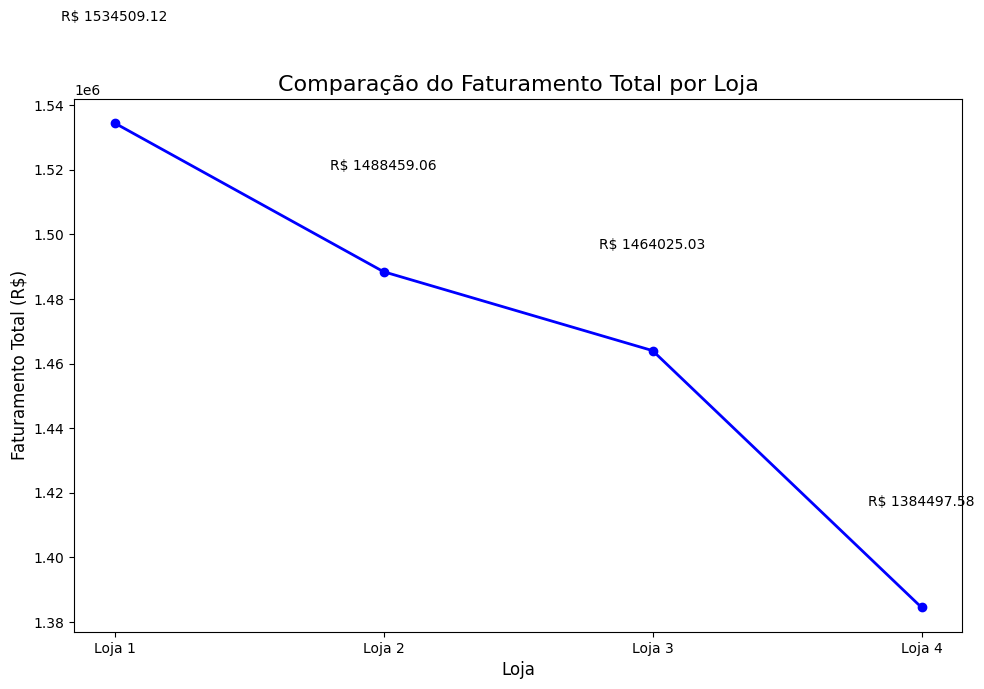

**Loja 1:** 1534509.12
**Loja 2:** 1488459.06
**Loja 3:** 1464025.03
**Loja 4:** 1384497.58

### 2. Vendas por Categoria

A análise das categorias mais vendidas nos ajuda a entender a demanda por diferentes tipos de produtos em cada loja. Foi feita a soma do total de transações no top 3 categorias por loja.

Em termos de categorias mais vendidas:
*   **Loja 4:** moveis (480), eletronicos (451) e brinquedos (338) = 1269
*   **Loja 3:** moveis (499), eletronicos (451) e brinquedos (315) = 1265
*   **Loja 1:** moveis (465), eletronicos (448) e brinquedos (324) = 1237
*   **Loja 2:** moveis (442), eletronicos (422) e brinquedos (313) = 1197



### 3. Média de Avaliação dos Clientes

A média de avaliação reflete a satisfação geral dos clientes com as compras em cada loja.

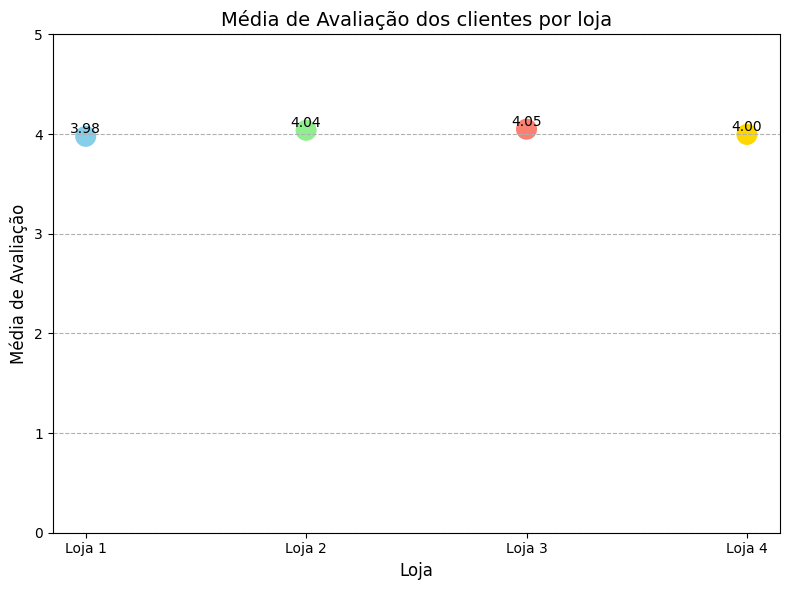

As médias de avaliação foram as seguintes:
*   **Loja 1:** 3,98
*   **Loja 2:** 4,04
*   **Loja 3:** 4,05
*   **Loja 4:** 4,00

A Loja 3 teve uma avaliação melhor e a Loja 1 teve a pior, apesar de ser a com maior faturamento

### 4. Produtos Mais e Menos Vendidos

Identificar os produtos de maior e menor sucesso nos dá insights sobre o mix de produtos de cada loja.

** Grafico?**

Os produtos mais e menos vendidos em cada loja foram:
*   **Loja 1:** Mais Vendido: Micro-ondas(60 vendas), Menos Vendido: Celular ABXY(33 vendas)
*   **Loja 2:** Mais Vendido: Iniciando em programação(65 vendas), Menos Vendido: Jogo de tabuleiro(32 vendas)
*   **Loja 3:** Mais Vendido: Kit banquetas(57 vendas), Menos Vendido: Blocos de montar(35 vendas)
*   **Loja 4:** Mais Vendido: Cama box(62 vendas), Guitarra(33 vendas)

### 5. Frete Médio

O frete médio é um custo associado às vendas que pode influenciar a decisão de compra do cliente e a lucratividade da loja.

Os fretes médios foram:
*   **Loja 1:** R$34,69
*   **Loja 2:** R$33,62
*   **Loja 3:** R$33,07
*   **Loja 4:** R$31,28

Desse modo, a Loja 1 teve melhor desempenho em relaçã este serviço, enquanto a Loja 4 teve menor retorno.

### 6. Análise Geográfica (Extra - Se você realizou)

A análise da distribuição geográfica das vendas pode revelar padrões importantes sobre a área de atuação de cada loja.

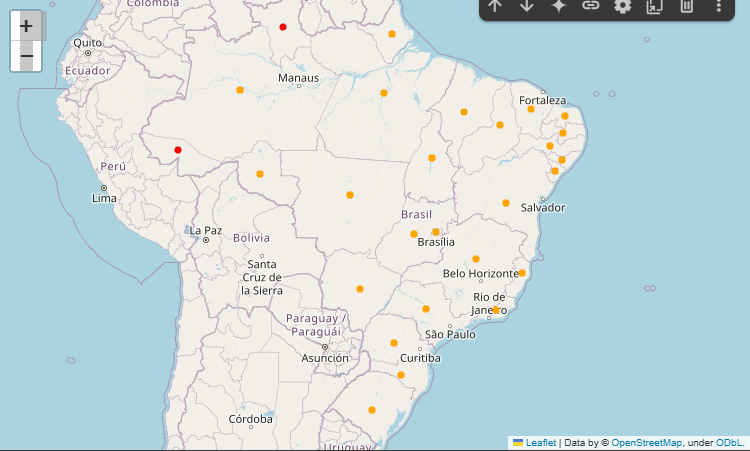

Esta análise revelou que a Loja 4 faz a maior quantidade de entregas no Brasil, superando a Loja 3.


**Justificativa:**

A escolha da Loja 4 se justifica pelos seguintes motivos:

*   **Faturamento:** A diferença de faturamento entre a Loja 1 (que mais fatura) e a Loja 4 (menor valor) é de  R$150.011,54. Entre a de menor faturamento acima da Loja 4, há uma diferença de R$79.527,45.
*   **Satisfação do Cliente:** As avaliações são moderadas para a loja 4, e mais baixas na loja 1. A Loja 1 possui nota 3,98, enquanto a Loja 4 tem avaliação 4,0. A nota mais alta é da Loja 3, com 4,05.
*   **Produtos/Categorias:** A Loja 4 é a que possui o maior volume de vendas, apesar da pouca diferença dentre as demais
*   **Frete:** O valor do frete médio da Loja 4 é o mais baixo entre as demais unidades, tendo o valor de R$31,2. A Loja 1 fatura nesse serviço, em média, R$34,69 (valor mais alto)

Apesar dos pontos fortes, como grande alcance nacional, a Loja 4 pode apresentar perda de faturamento, levando em consideração que mesmo com volume de vendas maior, seja por categoria ou item. Isso significa que podem ter outros fatores impactando. Comparando com as demais, é a menos rentável.

## Conclusão

Em resumo, a análise abrangente das métricas financeiras, de produtos e de clientes aponta a Loja 4 como a opção mais promissora para venda no momento, considerando que ela tem movimentação e alta rotatividade de produtos em estoque, apesar de faturar menos que as demais. Deste modo, o atual proprietário também não afetará suas unidades que trazem maior retorno. Recomenda-se que o Senhor João considere estes fatores ao tomar sua decisão final.

